In [3]:
import os
from pathlib import Path
import jsonlines
from dotenv import load_dotenv
import cv2
from PIL import Image

In [4]:
load_dotenv()

TEAM_NAME = os.getenv("TEAM_NAME", "7up")
TEAM_TRACK = os.getenv("TEAM_TRACK", "advanced")


input_dir = Path(f"/home/jupyter/{TEAM_TRACK}")
# input_dir = Path(f"../../data/{TEAM_TRACK}/train")
results_dir = Path(f"/home/jupyter/{TEAM_NAME}")
# results_dir = Path("results")
results_dir.mkdir(parents=True, exist_ok=True)
data = {'image': [], 'annotations': []}
count = 0

with jsonlines.open(input_dir / "vlm.jsonl") as reader:
    for obj in reader:
        if count < 100:  # Check if we have processed less than 10 entries
            data['image'].append(obj['image'])
            data['annotations'].append(obj['annotations'])
            count += 1
        else:
            break

In [8]:
idx = 11
image_path = data['image'][idx]

print(image_path)

# Load an image
image_path = input_dir / "images" / image_path  # Change this to your image path
image = cv2.imread(str(image_path))
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB

# Convert to PIL image
image = Image.fromarray(image)

image_11.jpg


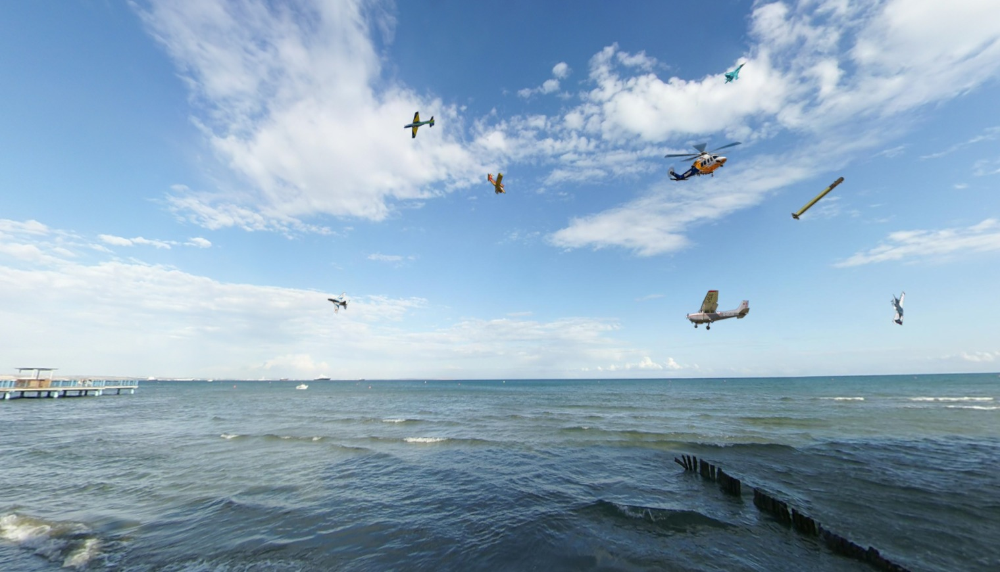

In [4]:
image

In [5]:
data["annotations"][idx]

[{'caption': 'grey and white light aircraft', 'bbox': [1040, 440, 100, 60]},
 {'caption': 'green and black missile', 'bbox': [1200, 268, 84, 68]},
 {'caption': 'blue and yellow helicopter', 'bbox': [1008, 216, 120, 60]},
 {'caption': 'yellow and red light aircraft', 'bbox': [740, 264, 28, 32]},
 {'caption': 'blue, yellow, and green fighter plane',
  'bbox': [612, 168, 48, 44]},
 {'caption': 'white fighter plane', 'bbox': [1352, 440, 24, 56]},
 {'caption': 'white and blue fighter jet', 'bbox': [496, 444, 36, 32]},
 {'caption': 'blue camouflage fighter jet', 'bbox': [1100, 92, 36, 36]}]

In [6]:
from torchvision import transforms
import matplotlib.pyplot as plt

# transform the image into tensor
transform = transforms.ToTensor()

img = transform(image)

# add extra dimension for later calculations
patches = img.data.unfold(0,3,3)

# break the image into patches (in height dimension)
patch = 20

patches = patches.unfold(1, patch, patch)
    
# break the image into patches (in width dimension)
patches = patches.unfold(2, patch, patch)

In [7]:
# For visualization

X = patches.shape[1]
Y = patches.shape[2]

fig, ax = plt.subplots(X, Y, figsize=(Y*2, X*2))
for x in range(X):
    for y in range(Y):
        ax[x, y].imshow(patches[0, x, y].permute(1, 2, 0))
        ax[x, y].axis("off")
fig.tight_layout()
plt.show()

In [8]:
# import torch

# # set the 6x6 window
# window = 6

# big_patch = torch.zeros(patch*window, patch*window, 3)
# patch_batch = patches[0][:window][:window]

# # visualize patch
# for y in range(window):
#     for x in range(window):
#         big_patch[y*patch:(y+1)*patch, x*patch:(x+1)*patch, :] = patch_batch[y, x].permute(1, 2, 0)

# plt.imshow(big_patch)
# plt.show()

# ###
# patches.shape

# ###
# window = 6
# stride = 1

# # window slides from top to bottom
# for Y in range(0, patches.shape[1]-window+1, stride):
#     # window slides from left to right
#     for X in range(0, patches.shape[2]-window+1, stride):
#         # initialize an empty big_patch array
#         big_patch = torch.zeros(patch*window, patch*window, 3)

#         # this gets the current batch of patches that will make big_batch
#         patch_batch = patches[0, Y:Y+window, X:X+window]
#         # loop through each patch in current batch
#         for y in range(patch_batch.shape[1]):
#             for x in range(patch_batch.shape[0]):
#                 # add patch to big_patch
#                 big_patch[
#                     y*patch:(y+1)*patch, x*patch:(x+1)*patch, :
#                 ] = patch_batch[y, x].permute(1, 2, 0)
#         # display current big_patch
#         plt.imshow(big_patch)
#         plt.show()

In [9]:
from transformers import CLIPProcessor, CLIPModel
import torch

# define processor and model
model_id = "openai/clip-vit-large-patch14"

processor = CLIPProcessor.from_pretrained(model_id)
model = CLIPModel.from_pretrained(model_id)

# move model to device if possible
device = 'cuda' if torch.cuda.is_available() else 'cpu'

model.to(device)
print(device)

cuda


In [10]:
# import torch
# from PIL import Image
# from transformers import CLIPProcessor, CLIPModel, CLIPTokenizer

# # Define the path where the model was saved
# model_name = "CLIP-large-finetuned"
# model_path = f"/home/jupyter/{model_name}"

# # Load the finetuned model, processor, and tokenizer
# model = CLIPModel.from_pretrained(model_path)
# processor = CLIPProcessor.from_pretrained(model_path)
# tokenizer = CLIPTokenizer.from_pretrained(model_path)

# # Move model to GPU if available
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# model.to(device)
# print(device)

In [11]:
window = 2
stride = 1

scores = torch.zeros(patches.shape[1], patches.shape[2])
runs = torch.ones(patches.shape[1], patches.shape[2])

for Y in range(0, patches.shape[1]-window+1, stride):
    for X in range(0, patches.shape[2]-window+1, stride):
        big_patch = torch.zeros(patch*window, patch*window, 3)
        patch_batch = patches[0, Y:Y+window, X:X+window]
        for y in range(window):
            for x in range(window):
                big_patch[
                    y*patch:(y+1)*patch, x*patch:(x+1)*patch, :
                ] = patch_batch[y, x].permute(1, 2, 0)
        # we preprocess the image and class label with the CLIP processor
        inputs = processor(
            images=big_patch,  # big patch image sent to CLIP
            return_tensors="pt",  # tell CLIP to return pytorch tensor
            text= "blue and yellow helicopter",  # class label sent to CLIP
            padding=True
        ).to(device) # move to device if possible

        # calculate and retrieve similarity score
        score = model(**inputs).logits_per_image.item()
        # sum up similarity scores from current and previous big patches
        # that were calculated for patches within the current window
        scores[Y:Y+window, X:X+window] += score
        # calculate the number of runs on each patch within the current window
        runs[Y:Y+window, X:X+window] += 1

It looks like you are trying to rescale already rescaled images. If the input images have pixel values between 0 and 1, set `do_rescale=False` to avoid rescaling them again.


In [12]:
import numpy as np 

# average score for each patch
scores /= runs

# transform the patches tensor 
adj_patches = patches.squeeze(0).permute(3, 4, 2, 0, 1)
# normalize scores
scores = (
    scores - scores.min()) / (scores.max() - scores.min()
)
# multiply patches by scores
adj_patches = adj_patches * scores
# rotate patches to visualize
adj_patches = adj_patches.permute(3, 4, 2, 0, 1)

Y = adj_patches.shape[0]
X = adj_patches.shape[1]

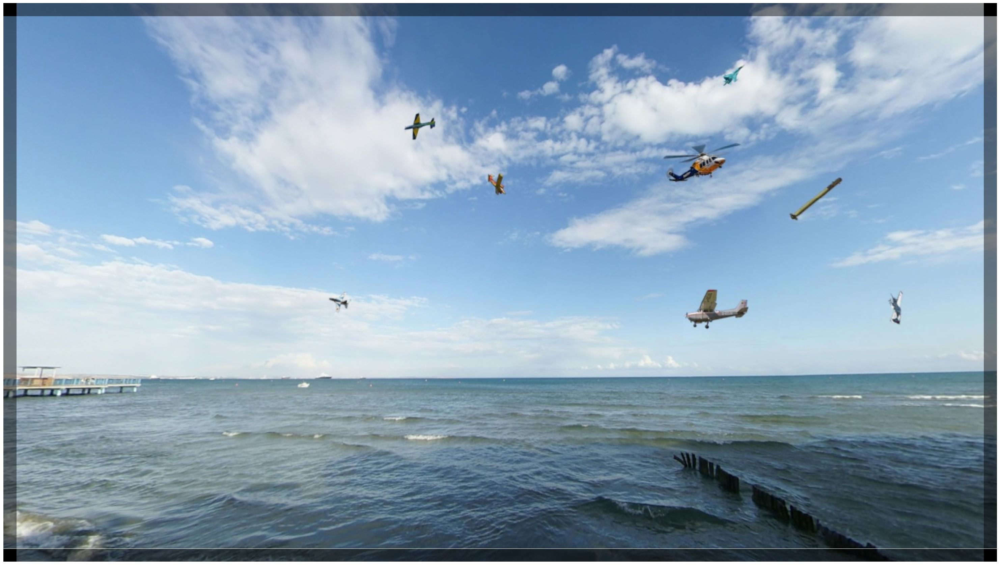

In [13]:
fig, ax = plt.subplots(Y, X, figsize=(X*.5, Y*.5))
for y in range(Y):
    for x in range(X):
        ax[y, x].imshow(adj_patches[y, x].permute(1, 2, 0))
        ax[y, x].axis("off")
        ax[y, x].set_aspect('equal')
plt.subplots_adjust(wspace=0, hspace=0)
plt.show()

In [14]:
# clip the scores' interval edges
for _ in range(1):
    scores = np.clip(scores-scores.mean(), 0, np.inf)

# normalize scores
scores = (
    scores - scores.min()) / (scores.max() - scores.min()
)
scores

tensor([[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 0.6636, 0.6675,  ..., 0.6388, 0.6364, 0.0000],
        [0.0000, 0.6648, 0.6676,  ..., 0.6378, 0.6347, 0.0000],
        ...,
        [0.0000, 0.6369, 0.6589,  ..., 0.6444, 0.6479, 0.0000],
        [0.0000, 0.6410, 0.6593,  ..., 0.6468, 0.6495, 0.0000],
        [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]])

In [15]:
scores.shape, patches.shape

(torch.Size([43, 76]), torch.Size([1, 43, 76, 3, 20, 20]))

In [16]:
# transform the patches tensor 
adj_patches = patches.squeeze(0).permute(3, 4, 2, 0, 1)
adj_patches.shape

torch.Size([20, 20, 3, 43, 76])

In [17]:
# multiply patches by scores
adj_patches = adj_patches * scores

# rotate patches to visualize
adj_patches = adj_patches.permute(3, 4, 2, 0, 1)
adj_patches.shape

torch.Size([43, 76, 3, 20, 20])

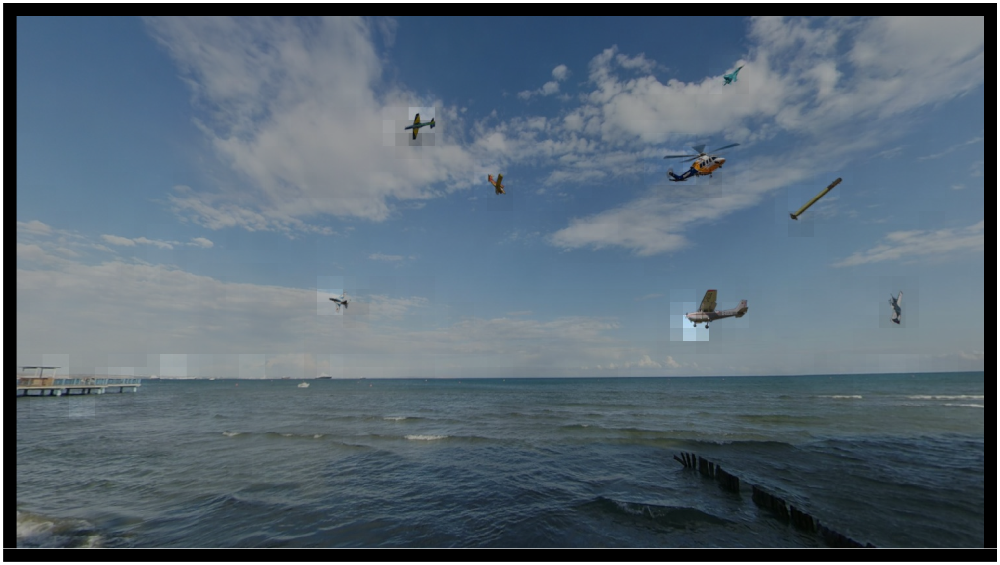

In [18]:
Y = adj_patches.shape[0]
X = adj_patches.shape[1]

fig, ax = plt.subplots(Y, X, figsize=(X*.5, Y*.5))
for y in range(Y):
    for x in range(X):
        ax[y, x].imshow(adj_patches[y, x].permute(1, 2, 0))
        ax[y, x].axis("off")
        ax[y, x].set_aspect('equal')
plt.subplots_adjust(wspace=0, hspace=0)
plt.show()

In [19]:
# window = 6
# stride = 1

# scores = torch.zeros(patches.shape[1], patches.shape[2])
# runs = torch.ones(patches.shape[1], patches.shape[2])

# for Y in range(0, patches.shape[1]-window, stride):
#     for X in range(0, patches.shape[2]-window, stride):
#         big_patch = torch.zeros(patch*window, patch*window, 3)
#         patch_batch = patches[0, Y:Y+window, X:X+window]
#         for y in range(window):
#             for x in range(window):
#                 big_patch[y*patch:(y+1)*patch, x*patch:(x+1)*patch, :] = patch_batch[y, x].permute(1, 2, 0)
#         inputs = processor(
#             images=big_patch,
#             return_tensors="pt",
#             text="a helicopter",
#             padding=True
#         ).to(device)
#         score = model(**inputs).logits_per_image.item()
#         scores[Y:Y+window, X:X+window] += score
#         runs[Y:Y+window, X:X+window] += 1
        
# scores /= runs
# for _ in range(3):
#     scores = np.clip(scores-scores.mean(), 0, np.inf)
# # normalize scores
# scores = (scores - scores.min()) / (scores.max() - scores.min())

# # adjust patches
# adj_patches = patches.squeeze(0).permute(3, 4, 2, 0, 1) * scores
# adj_patches = adj_patches.permute(3, 4, 2, 0, 1)

# Y = adj_patches.shape[0]
# X = adj_patches.shape[1]

# fig, ax = plt.subplots(Y, X, figsize=(X*.5, Y*.5))
# for y in range(Y):
#     for x in range(X):
#         ax[y, x].imshow(adj_patches[y, x].permute(1, 2, 0))
#         ax[y, x].axis("off")
#         ax[y, x].set_aspect('equal')
# plt.subplots_adjust(wspace=0, hspace=0)
# plt.show()

In [ ]:
# scores higher than 0.5
detection = scores > 0.80

# non-zero positions
np.nonzero(detection)

y_min, y_max = (
    np.nonzero(detection)[:,0].min().item(),
    np.nonzero(detection)[:,0].max().item()+1
)

x_min, x_max = (
    np.nonzero(detection)[:,1].min().item(),
    np.nonzero(detection)[:,1].max().item()+1
)

y_min *= patch
y_max *= patch
x_min *= patch
x_max *= patch

height = y_max - y_min
# height = height / 3
width = x_max - x_min
# width = width / 2

# image shape
img.data.numpy().shape

# move color channel to final dim
image = np.moveaxis(img.data.numpy(), 0, -1)

import matplotlib.patches as patches

fig, ax = plt.subplots(figsize=(Y*0.5, X*0.5))

ax.imshow(image)

# Create a Rectangle patch
rect = patches.Rectangle(
    (x_min, y_min), width, height,
    linewidth=3, edgecolor='#FAFF00', facecolor='none'
)

# Add the patch to the Axes
ax.add_patch(rect)

plt.show()

In [41]:
# from tqdm.auto import tqdm
# import matplotlib.patches as patches
# import numpy as np
# import matplotlib.pyplot as plt

# colors = ['#FAFF00', '#8CF1FF']

# def get_patches(img, patch_size=256):
#     # add extra dimension for later calculations
#     img_patches = img.data.unfold(0,3,3)
#     # break the image into patches (in height dimension)
#     img_patches = img_patches.unfold(1, patch_size, patch_size)
#     # break the image into patches (in width dimension)
#     img_patches = img_patches.unfold(2, patch_size, patch_size)
#     return img_patches

# def get_scores(img_patches, prompt, window=6, stride=1):
#     # initialize scores and runs arrays
#     scores = torch.zeros(img_patches.shape[1], img_patches.shape[2])
#     runs = torch.ones(img_patches.shape[1], img_patches.shape[2])

#     # iterate through patches
#     for Y in range(0, img_patches.shape[1]-window+1, stride):
#         for X in range(0, img_patches.shape[2]-window+1, stride):
#             # initialize array to store big patches
#             big_patch = torch.zeros(patch*window, patch*window, 3)
#             # get a single big patch
#             patch_batch = img_patches[0, Y:Y+window, X:X+window]
#             # iteratively build all big patches
#             for y in range(window):
#                 for x in range(window):
#                     big_patch[y*patch:(y+1)*patch, x*patch:(x+1)*patch, :] = patch_batch[y, x].permute(1, 2, 0)
#             inputs = processor(
#                 images=big_patch, # image trasmitted to the model
#                 return_tensors="pt", # return pytorch tensor
#                 text=prompt, # text trasmitted to the model
#                 padding=True
#             ).to(device) # move to device if possible

#             score = model(**inputs).logits_per_image.item()
#             # sum up similarity scores
#             scores[Y:Y+window, X:X+window] += score
#             # calculate the number of runs 
#             runs[Y:Y+window, X:X+window] += 1
#     # calculate average scores
#     scores /= runs
#     # clip scores
#     for _ in range(3):
#         scores = np.clip(scores-scores.mean(), 0, np.inf)
#     # normalize scores
#     scores = (scores - scores.min()) / (scores.max() - scores.min())
#     return scores

# def get_box(scores, patch_size=256, threshold=0.5):
#     detection = scores > threshold
#     # find box corners
#     y_min, y_max = np.nonzero(detection)[:,0].min().item(), np.nonzero(detection)[:,0].max().item()+1
#     x_min, x_max = np.nonzero(detection)[:,1].min().item(), np.nonzero(detection)[:,1].max().item()+1
#     # convert from patch co-ords to pixel co-ords
#     y_min *= patch_size
#     y_max *= patch_size
#     x_min *= patch_size
#     x_max *= patch_size
#     # calculate box height and width
#     height = y_max - y_min
#     width = x_max - x_min
#     return x_min, y_min, width, height

# def detect(prompts, img, patch_size=256, window=6, stride=1, threshold=0.5):
#     # build image patches for detection
#     img_patches = get_patches(img, patch_size)
#     # convert image to format for displaying with matplotlib
#     image = np.moveaxis(img.data.numpy(), 0, -1)
#     # initialize plot to display image + bounding boxes
#     fig, ax = plt.subplots(figsize=(Y*0.5, X*0.5))
#     ax.imshow(image)
#     # process image through object detection steps
#     for i, prompt in enumerate(tqdm(prompts)):
#         scores = get_scores(img_patches, prompt, window, stride)
#         x, y, width, height = get_box(scores, patch_size, threshold)
#         # create the bounding box
#         rect = patches.Rectangle((x, y), width, height, linewidth=3, edgecolor=colors[i], facecolor='none')
#         # add the patch to the Axes
#         ax.add_patch(rect)
#     plt.show()